<a href="https://colab.research.google.com/github/sayakghorai34/Deep_Convolutional_GAN/blob/main/DeepConv_GAN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
import numpy as np

Implementation of DCGAN from the paper "Unsupervised Representation Learning with Deep Convolutional Generative Adversarial Networks" by Radford et al. (2016).https://arxiv.org/abs/1511.06434

## Implement Discriminator

In [ ]:
class Discriminator(nn.Module):
    def __init__(self, channels_c, features_n):
        super(Discriminator, self).__init__()
        # input: N*channels_c*64*64
        self.discriminator = nn.Sequential(
            nn.Conv2d(
                channels_c,
                features_n,
                kernel_size=4,
                padding=1,
                stride=2
            ), # 32*32
            nn.LeakyReLU(0.15),
            self._block(features_n, features_n*2, 4, 2, 1), # 16*16
            self._block(features_n*2, features_n*4, 4, 2, 1), # 8*8
            self._block(features_n*4, features_n*8, 4, 2, 1), # 4*4
            nn.Conv2d(features_n*8,
                      1,
                      kernel_size=4,
                      stride=2,
                      padding=0
            ), # 1*1
            nn.Sigmoid()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.Conv2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.2)
        )

    def forward(self, x):
        return self.discriminator(x)


In [ ]:
class Generator(nn.Module):
    def __init__(self, z_dim, channels_c, features_n):
        super(Generator, self).__init__()
        self.generator = nn.Sequential(
            self._block(z_dim, features_n*16, 4, 1, 0),
            self._block(features_n*16, features_n*8, 4, 2, 1),
            self._block(features_n*8, features_n*4, 4, 2, 1),
            self._block(features_n*4, features_n*2, 4, 2, 1),
            nn.ConvTranspose2d(
                features_n*2,
                channels_c,
                kernel_size=4,
                stride=2,
                padding=1
            ),
            nn.Tanh()
        )

    def _block(self, in_channels, out_channels, kernel_size, stride, padding):
        return nn.Sequential(
            nn.ConvTranspose2d(
                in_channels,
                out_channels,
                kernel_size,
                stride,
                padding,
                bias=False
            ),
            nn.BatchNorm2d(out_channels),
            nn.ReLU()
        )

    def forward(self, x):
        return self.generator(x)


In [ ]:
def initialize_weights(model):
    for module in model.modules():
        if isinstance(module, (nn.ConvTranspose2d, nn.Conv2d, nn.BatchNorm2d)):
            nn.init.normal_(module.weight.data, 0.0, 0.02)

In [ ]:
def test():
    N, in_channels, H, W = 8, 3, 64, 64
    z_dim = 100
    x = torch.rand((N, in_channels, H, W))

    # Test Discriminator
    discriminator = Discriminator(in_channels, 8)
    initialize_weights(discriminator)
    disc_out = discriminator(x)
    print("Discriminator Output Shape:", disc_out.shape)
    assert disc_out.shape == (N, 1, 1, 1)

    # Test Generator
    generator = Generator(z_dim, in_channels, 8)
    initialize_weights(generator)
    z = torch.rand((N, z_dim, 1, 1))
    gen_out = generator(z)
    print("Generator Output Shape:", gen_out.shape)
    assert gen_out.shape == (N, in_channels, H, W)

test()

Discriminator Output Shape: torch.Size([8, 1, 1, 1])
Generator Output Shape: torch.Size([8, 3, 64, 64])


## Train

In [ ]:
import torch.optim as optim
import torchvision
import torchvision.datasets as ds
import torchvision.transforms as tf
from torch.utils.data import DataLoader
from torch.utils.tensorboard import SummaryWriter
# from tensorboardX import SummaryWriter

### Select Accelerator

#### Kaggle has efficient cuda enabled P100 gpu. SO to use it, run the next cell

In [ ]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

In [ ]:
!nvidia-smi

Wed Aug  7 13:38:57 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   38C    P8              11W /  70W |      3MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

#### I used M1 Mac with mps accelerator using the below cell

In [ ]:
# device = torch.device("mps" if torch.backends.mps.is_available() else "cpu")
# device

### Hyper-Params

In [ ]:
lr = 2e-4
batch_size = 128
img_size = 64
num_channels = 1
z_dim = 100
num_epoch = 20
disc_feature = 64
gen_feature = 64
step = 0

Parameters were chosen to be the same as in the paper.

### Other Setups

### disable ssl verification

In [ ]:
import ssl

ssl._create_default_https_context = ssl._create_unverified_context


In [ ]:
transforms = tf.Compose([
    tf.Resize(img_size),
    tf.ToTensor(),
    tf.Normalize(
        [0.5 for _ in range(num_channels)],
        [0.5 for _ in range(num_channels)]
    )
])

dataset = ds.MNIST(root = "dataset/",train=True, download=True, transform = transforms)
loader = DataLoader(
    dataset,
    batch_size = batch_size,
    shuffle = True,
    num_workers = 6,
    pin_memory = True
    )

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 9912422/9912422 [00:02<00:00, 4608130.13it/s]


Extracting dataset/MNIST/raw/train-images-idx3-ubyte.gz to dataset/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 28881/28881 [00:00<00:00, 26391218.70it/s]


Extracting dataset/MNIST/raw/train-labels-idx1-ubyte.gz to dataset/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 1648877/1648877 [00:01<00:00, 1073464.63it/s]


Extracting dataset/MNIST/raw/t10k-images-idx3-ubyte.gz to dataset/MNIST/raw

Failed to download (trying next):
HTTP Error 403: Forbidden



100%|██████████| 4542/4542 [00:00<00:00, 4270461.50it/s]

Extracting dataset/MNIST/raw/t10k-labels-idx1-ubyte.gz to dataset/MNIST/raw




/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [ ]:
generator = Generator(z_dim, num_channels, gen_feature).to(device)
discriminator = Discriminator(num_channels, disc_feature).to(device)
initialize_weights(generator)
initialize_weights(discriminator)

gen_opt = optim.Adam(generator.parameters(), lr = lr, betas = (0.5, 0.999))
disc_opt = optim.Adam(discriminator.parameters(), lr = lr, betas = (0.5, 0.999))

loss = nn.BCELoss()

noise = torch.randn(32, z_dim, 1, 1).to(device)
real_logs = SummaryWriter(f"/content/logs/real")
fake_logs = SummaryWriter(f"/content/logs/fake")

generator.train()
discriminator.train()

Discriminator(
  (discriminator): Sequential(
    (0): Conv2d(1, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.15)
    (2): Sequential(
      (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (3): Sequential(
      (0): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (4): Sequential(
      (0): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
      (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (2): LeakyReLU(negative_slope=0.2)
    )
    (5): Conv2d(512, 1, kernel_size=(4, 4), stride=(2, 2))
    (6): Sigmoid()
  )
)

## Training and logging in Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

### For some reason, tensorboard is not working in kaggle. You can download the logs and see in local system

In [ ]:
for epoch in range(num_epoch):
    for batch_index, (act, _) in enumerate(loader):
        act = act.to(device)
        noise = torch.randn(batch_size, z_dim, 1, 1).to(device)
        fake = generator(noise.to(device))

        # Train Discriminator
        disc_act = discriminator(act).reshape(-1)
        disc_loss_act = loss(disc_act, torch.ones_like(disc_act))

        # disc_fake = discriminator(fake.detach()).reshape(-1)  # Detach fake to avoid gradients here
        disc_fake = discriminator(fake).reshape(-1)
        disc_loss_fake = loss(disc_fake, torch.zeros_like(disc_fake))

        disc_loss_total = (disc_loss_act + disc_loss_fake)/2
        discriminator.zero_grad()
        disc_loss_total.backward(retain_graph=True)
        disc_opt.step()

        # Train Generator
        output = discriminator(fake).reshape(-1)
        gen_loss = loss(output, torch.ones_like(output))
        generator.zero_grad()
        gen_loss.backward()
        gen_opt.step()

        # Print Metrics
        if batch_index % 100 == 0:
            print(f"Epoch [{epoch}/{num_epoch}] Batch {batch_index}/{len(loader)} Loss D: {disc_loss_total:.8f} G: {gen_loss:.8f}")
            with torch.no_grad():
                fake = generator(noise)
                act_img_grid = torchvision.utils.make_grid(act[:32], normalize=True)
                fake_img_grid = torchvision.utils.make_grid(fake[:32], normalize=True)

                real_logs.add_image("Real", act_img_grid, global_step=step)
                fake_logs.add_image("Fake", fake_img_grid, global_step=step)
            step+=1


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 6 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch [0/20] Batch 0/469 Loss D: 0.69703865 G: 0.76020885
Epoch [0/20] Batch 100/469 Loss D: 0.01544903 G: 4.08001900
Epoch [0/20] Batch 200/469 Loss D: 0.74240887 G: 0.72234327
Epoch [0/20] Batch 300/469 Loss D: 0.53623319 G: 0.84375125
Epoch [0/20] Batch 400/469 Loss D: 0.56355810 G: 0.86552626
Epoch [1/20] Batch 0/469 Loss D: 0.54434347 G: 0.99858737
Epoch [1/20] Batch 100/469 Loss D: 0.64666849 G: 0.78325284
Epoch [1/20] Batch 200/469 Loss D: 0.59356761 G: 0.72193974
Epoch [1/20] Batch 300/469 Loss D: 0.55409539 G: 0.92210203
Epoch [1/20] Batch 400/469 Loss D: 0.60843390 G: 0.84488642
Epoch [2/20] Batch 0/469 Loss D: 0.70025074 G: 0.85794979
Epoch [2/20] Batch 100/469 Loss D: 0.52943385 G: 0.95730650
Epoch [2/20] Batch 200/469 Loss D: 0.56407082 G: 1.54968667
Epoch [2/20] Batch 300/469 Loss D: 0.56096995 G: 0.93667555
Epoch [2/20] Batch 400/469 Loss D: 0.66140914 G: 0.63448751
Epoch [3/20] Batch 0/469 Loss D: 0.59153223 G: 0.95767564
Epoch [3/20] Batch 100/469 Loss D: 0.55858147 G:

### As somehow, Tensorboard doesn't work well across all environment, and I am new to Tensorboard, I couldn't figure out a way to save Tensorboard interactive window with in the notebook itself. So for a static demo output, the below cell plots some real and fake images

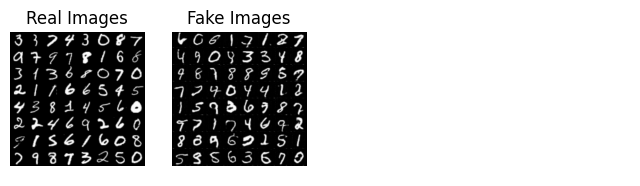

In [ ]:
import matplotlib.pyplot as plt

def tensor_to_np(tensor):
    return tensor.cpu().numpy().transpose((1, 2, 0))

def plot_images(images, titles, ncols=4):
    n_images = len(images)
    nrows = (n_images + ncols - 1) // ncols
    fig, axes = plt.subplots(nrows, ncols, figsize=(ncols * 2, nrows * 2))

    if nrows == 1:
        axes = axes.flatten()

    for i, (img, title) in enumerate(zip(images, titles)):
        ax = axes[i]
        ax.imshow(tensor_to_np(img))
        ax.set_title(title)
        ax.axis('off')

    if len(images) < nrows * ncols:
        for j in range(len(images), nrows * ncols):
            axes[j].axis('off')

    plt.show()

with torch.no_grad():
    noise = torch.randn(batch_size, z_dim, 1, 1, device=device)
    fake = generator(noise)

    real_images = next(iter(loader))[0][:64].to(device)

    real_img_grid = torchvision.utils.make_grid(real_images.cpu(), normalize=True)
    fake_img_grid = torchvision.utils.make_grid(fake[:64].cpu(), normalize=True)

    plot_images([real_img_grid, fake_img_grid], ['Real Images', 'Fake Images'])


Fake images are significantly good as compaed to the original data.

With the parameters and architecture given in the paper, I had tried to use the CelebA dataset to produce 3 channel rgb image. But somehow, might be due to the extreme hyperparameter sensitivity, the produced images were only random noises. It started promisingly, but after 3rd epoch, it started getting noisy and at the end, only noise was there.

I will try to implement another GAN suitable for rgb image production from some other paper. The goal that time will be producing Selective RGB images.